# Requirement
- I need the data of most popular programming languages in Pakistan.


In [1]:
from matplotlib import pyplot as plt
from collections import Counter
import numpy as np
import pandas as pd

### Loading Data
- Data Source Stackoverflow

In [2]:
url = r"E:\Project\Anaconda\csv\stackoverflow\survey_results_public.csv"
df = pd.read_csv(url)

### Having a look of Data

In [3]:
df.head()

,Respondent,MainBranch,Hobbyist,Age,Age1stCode,CompFreq,CompTotal,ConvertedComp,Country,CurrencyDesc,...,SurveyEase,SurveyLength,Trans,UndergradMajor,WebframeDesireNextYear,WebframeWorkedWith,WelcomeChange,WorkWeekHrs,YearsCode,YearsCodePro
0,1,I am a developer by profession,Yes,NaN,13,Monthly,NaN,NaN,Germany,European Euro,...,Neither easy nor difficult,Appropriate in length,No,"Computer science, computer engineering, or sof...",ASP.NET Core,ASP.NET;ASP.NET Core,Just as welcome now as I felt last year,50.0,36,27
1,2,I am a developer by profession,No,NaN,19,NaN,NaN,NaN,United Kingdom,Pound sterling,...,NaN,NaN,NaN,"Computer science, computer engineering, or sof...",NaN,NaN,Somewhat more welcome now than last year,NaN,7,4
2,3,I code primarily as a hobby,Yes,NaN,15,NaN,NaN,NaN,Russian Federation,NaN,...,Neither easy nor difficult,Appropriate in length,NaN,NaN,NaN,NaN,Somewhat more welcome now than last year,NaN,4,NaN
3,4,I am a developer by profession,Yes,25.0,18,NaN,NaN,NaN,Albania,Albanian lek,...,NaN,NaN,No,"Computer science, computer engineering, or sof...",NaN,NaN,Somewhat less welcome now than last year,40.0,7,4
4,5,"I used to be a developer by profession, but no...",Yes,31.0,16,NaN,NaN,NaN,United States,NaN,...,Easy,Too short,No,"Computer science, computer engineering, or sof...",Django;Ruby on Rails,Ruby on Rails,Just as welcome now as I felt last year,NaN,15,8


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64461 entries, 0 to 64460
Data columns (total 61 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Respondent                    64461 non-null  int64  
 1   MainBranch                    64162 non-null  object 
 2   Hobbyist                      64416 non-null  object 
 3   Age                           45446 non-null  float64
 4   Age1stCode                    57900 non-null  object 
 5   CompFreq                      40069 non-null  object 
 6   CompTotal                     34826 non-null  float64
 7   ConvertedComp                 34756 non-null  float64
 8   Country                       64072 non-null  object 
 9   CurrencyDesc                  45472 non-null  object 
 10  CurrencySymbol                45472 non-null  object 
 11  DatabaseDesireNextYear        44070 non-null  object 
 12  DatabaseWorkedWith            49537 non-null  object 
 13  D

### Filter Data
- Filtering Data On the Base of Country == Pakistan 

In [5]:
df['Country']

0                   Germany
1            United Kingdom
2        Russian Federation
3                   Albania
4             United States
                ...        
64456         United States
64457               Morocco
64458              Viet Nam
64459                Poland
64460                 Spain
Name: Country, Length: 64461, dtype: object

In [3]:
filter_country = df['Country'] == 'Pakistan'

In [4]:
df_p = df[filter_country]

In [14]:
df_p.head()

,Respondent,MainBranch,Hobbyist,Age,Age1stCode,CompFreq,CompTotal,ConvertedComp,Country,CurrencyDesc,...,SurveyEase,SurveyLength,Trans,UndergradMajor,WebframeDesireNextYear,WebframeWorkedWith,WelcomeChange,WorkWeekHrs,YearsCode,YearsCodePro
199,201,I am a developer by profession,Yes,27.0,18,NaN,NaN,NaN,Pakistan,Pakistani rupee,...,Easy,Appropriate in length,No,"Computer science, computer engineering, or sof...",Angular;Django;Express;React.js;Spring,Angular;Angular.js;Express;jQuery;Spring,Just as welcome now as I felt last year,40.0,9,4
567,569,I am a developer by profession,No,32.0,22,Monthly,220000.0,17124.0,Pakistan,Pakistani rupee,...,Neither easy nor difficult,Appropriate in length,No,"Computer science, computer engineering, or sof...",Express;jQuery;React.js;Vue.js,jQuery,A lot less welcome now than last year,40.0,8,6
632,634,I am a developer by profession,Yes,25.0,18,Monthly,2500.0,192.0,Pakistan,Pakistani rupee,...,Easy,Too long,No,"Information systems, information technology, o...",ASP.NET,ASP.NET,Just as welcome now as I felt last year,42.0,6,3
761,763,I am a developer by profession,Yes,NaN,15,NaN,NaN,NaN,Pakistan,NaN,...,Easy,Too short,No,"Computer science, computer engineering, or sof...",NaN,Laravel,NaN,NaN,14,NaN
828,830,I am a developer by profession,Yes,25.0,22,NaN,NaN,NaN,Pakistan,Pakistani rupee,...,Neither easy nor difficult,Appropriate in length,No,Mathematics or statistics,NaN,NaN,Just as welcome now as I felt last year,40.0,4,2


In [ ]:
df_pak = df_p['LanguageWorkedWith']

### Filtering Pakistan data for LanguageWorkedWith.

In [12]:
df_pak = df_p[['Country', 'LanguageWorkedWith']]

In [16]:
df_pak.to_csv("pak_popular_language.csv")

In [14]:
df_pak.index = np.arange(len(df_pak.index))

In [5]:
# Fetching data only for programming languages
pak_lang = df_p['LanguageWorkedWith']

In [71]:
pak_lang.index

Int64Index([  199,   567,   632,   761,   828,  1131,  1169,  1509,  1699,
             1847,
            ...
            63637, 63801, 63899, 63954, 64185, 64246, 64367, 64395, 64400,
            64437],
           dtype='int64', length=809)

In [8]:
# Reordering indexes
index_len = len(pak_lang.index) 
pak_lang.index = np.arange(index_len)

In [9]:
pak_lang.head()

0    Bash/Shell/PowerShell;HTML/CSS;Java;JavaScript...
1                                  HTML/CSS;JavaScript
2                                              C#;Java
3            C;HTML/CSS;Java;JavaScript;PHP;Python;SQL
4                                             Python;R
Name: LanguageWorkedWith, dtype: object

### Finding the way to data Cleaning
### Cleaning Data for popular programming languages in Pakistan and counting how many they are.

In [51]:
# looking for NAN values
pak_lang.isnull().sum()

115

In [48]:
import seaborn as sns

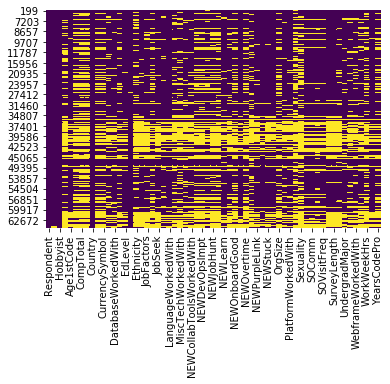

In [54]:
# Visualizing NAN values using seaborn.heatmap()
sns.heatmap(df_p.isnull(), cbar=False, cmap='viridis')

In [59]:
# sns.heatmap(pak_lang.isnull())
df_p[pak_lang.isnull()]

IndexingError: Unalignable boolean Series provided as indexer (index of the boolean Series and of the indexed object do not match).

In [69]:
df_p['LanguageWorkedWith'].index = df_p.index

In [70]:
n_val_in_lw = df_p['LanguageWorkedWith'].isnull()
df_p[n_val_in_lw]

,Respondent,MainBranch,Hobbyist,Age,Age1stCode,CompFreq,CompTotal,ConvertedComp,Country,CurrencyDesc,...,SurveyEase,SurveyLength,Trans,UndergradMajor,WebframeDesireNextYear,WebframeWorkedWith,WelcomeChange,WorkWeekHrs,YearsCode,YearsCodePro
8642,8674,I am a student who is learning to code,Yes,16.0,10,NaN,NaN,NaN,Pakistan,NaN,...,Neither easy nor difficult,Appropriate in length,NaN,NaN,Angular;Angular.js;ASP.NET;ASP.NET Core;jQuery...,ASP.NET;ASP.NET Core;jQuery,A lot more welcome now than last year,NaN,6,NaN
12961,13001,I am a student who is learning to code,No,NaN,18,NaN,NaN,NaN,Pakistan,NaN,...,Easy,Appropriate in length,No,"Computer science, computer engineering, or sof...",ASP.NET;ASP.NET Core,NaN,NaN,NaN,5,NaN
26541,26639,I am a student who is learning to code,No,20.0,18,NaN,NaN,NaN,Pakistan,NaN,...,Easy,Appropriate in length,NaN,"Computer science, computer engineering, or sof...",NaN,NaN,Just as welcome now as I felt last year,NaN,Less than 1 year,NaN
28894,29003,I am a student who is learning to code,No,NaN,15,NaN,NaN,NaN,Pakistan,NaN,...,NaN,NaN,NaN,"Computer science, computer engineering, or sof...",NaN,NaN,NaN,NaN,4,NaN
35538,35684,I am a developer by profession,Yes,NaN,NaN,NaN,NaN,NaN,Pakistan,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63400,64808,I am a developer by profession,Yes,NaN,NaN,NaN,NaN,NaN,Pakistan,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
63600,65024,I am a developer by profession,No,NaN,15,NaN,NaN,NaN,Pakistan,Pakistani rupee,...,NaN,NaN,NaN,"Computer science, computer engineering, or sof...",NaN,NaN,NaN,NaN,13,10
63637,65063,I am a developer by profession,Yes,NaN,20,Monthly,70000.0,5448.0,Pakistan,Pakistani rupee,...,NaN,NaN,NaN,"Computer science, computer engineering, or sof...",NaN,NaN,NaN,NaN,4,2
64367,47832,NaN,Yes,NaN,NaN,NaN,NaN,NaN,Pakistan,NaN,...,NaN,NaN,NaN,"A natural science (such as biology, chemistry,...",NaN,NaN,NaN,NaN,NaN,NaN


### Data Cleaned and Counted

In [38]:
c = Counter()

In [81]:

for lang in pak_lang:
    if type(lang) == type(str()):
        # print(lang)
        c.update(lang.split(';'))

In [82]:
c.most_common()

[('HTML/CSS', 487),
 ('JavaScript', 479),
 ('SQL', 375),
 ('Java', 293),
 ('PHP', 278),
 ('C#', 256),
 ('Python', 246),
 ('C++', 246),
 ('C', 168),
 ('TypeScript', 144),
 ('Assembly', 86),
 ('Kotlin', 67),
 ('Bash/Shell/PowerShell', 66),
 ('Swift', 48),
 ('Ruby', 32),
 ('Dart', 29),
 ('VBA', 23),
 ('Objective-C', 23),
 ('R', 22),
 ('Go', 21),
 ('Rust', 10),
 ('Perl', 5),
 ('Scala', 4),
 ('Haskell', 1)]

In [94]:
# Serrating information into languages and popularity
languages = []
popularity = []

for l,p in c.most_common():
    languages.append(l)
    popularity.append(p)

## Ploting Results

In [107]:
# Reversing list to make plot most popular on the top and least populat on last.
languages.reverse()
popularity.reverse()

In [117]:
# plt.style.available
plt.style.use('fivethirtyeight')

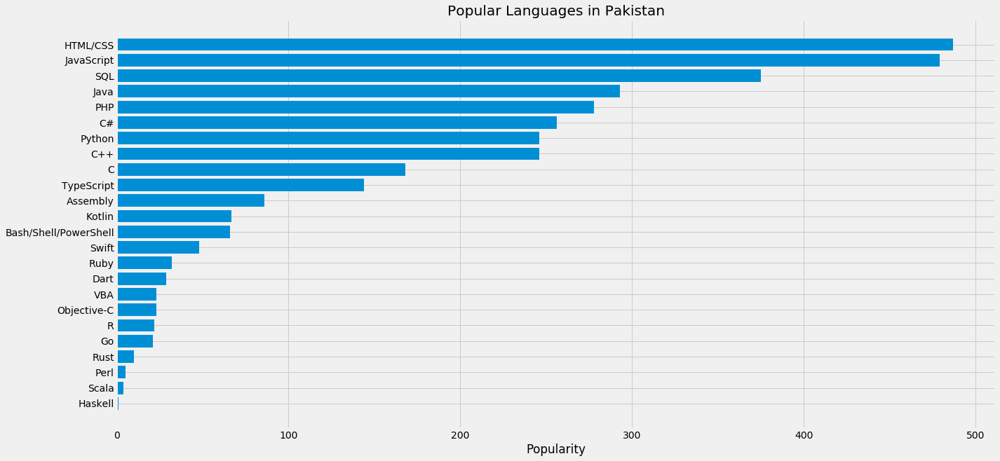

In [133]:
plt.figure(figsize=(20,10))
plt.barh(languages,popularity,)

plt.title('Popular Languages in Pakistan')
plt.xlabel('Popularity')

plt.xlabel("Popularity")
plt.
# plt.tight_layout()
plt.show()